# CS 472 HW 2
Ian McConachie,
CS 472: Humphrey Shi, Steven Walton

February 26, 2023

# Introduction

Let's begin with some import statements for python libraries we will be using in the exercises below.

In [1]:
import torch
from torch.utils.data import DataLoader
from torchvision import datasets
from torchvision import transforms as T
import matplotlib.pyplot as plt
from torch import nn, optim
from tqdm import tqdm
import random
import torchvision.utils as vutils
import matplotlib.animation as animation
from IPython.display import HTML
import numpy as np



Now, let's get the datasets we will be using into our workspace.

In [2]:
b_size=64

cifar_dataset_train = datasets.CIFAR10(root='./', train=True, download=True, transform=T.ToTensor())
cifar_train = DataLoader(cifar_dataset_train, batch_size=b_size, shuffle=True)
cifar_dataset_test = datasets.CIFAR10(root='./', train=False, download=True, transform=T.ToTensor())
cifar_test = DataLoader(cifar_dataset_test, batch_size=b_size, shuffle=True)

mnist_dataset = datasets.MNIST(root='./', train=True, download=True, transform=T.ToTensor())
mnist_train = DataLoader(mnist_dataset, batch_size=b_size, shuffle=True)
mnist_dataset_test = datasets.MNIST(root='./', train=False, download=True, transform=T.ToTensor())
mnist_test = DataLoader(mnist_dataset_test, batch_size=b_size, shuffle=True)

100%|██████████| 170498071/170498071 [00:04<00:00, 38437256.73it/s]


Extracting ./cifar-10-python.tar.gz to ./
Files already downloaded and verified


100%|██████████| 9912422/9912422 [00:00<00:00, 97871029.60it/s]


Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw



100%|██████████| 28881/28881 [00:00<00:00, 90942713.08it/s]


Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 32096473.77it/s]


Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 809696.05it/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



We also want to set the device preference for the rest of exercises to the GPU rather than the CPU because it is better for our model training.

In [3]:
# Prefer to use GPU to process, if not use CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

Let's visualize the data we have downloaded to get a better idea of what we're working with for inputs. We'll start with the MNIST dataset of handwritten numerals.

Type: <class 'list'>
Length: 2
More Types: <class 'torch.Tensor'>, <class 'torch.Tensor'>
Shapes: torch.Size([64, 1, 28, 28]), torch.Size([64])
Labels: tensor([5, 6, 3, 9, 1, 5, 9, 1, 2, 9, 1, 0, 5, 0, 1, 4, 0, 9, 9, 6, 1, 5, 3, 4,
        5, 7, 1, 8, 1, 2, 2, 4, 2, 2, 3, 7, 7, 4, 3, 1, 3, 7, 4, 9, 1, 1, 9, 1,
        2, 5, 1, 8, 1, 1, 0, 8, 6, 5, 9, 2, 6, 6, 3, 5])



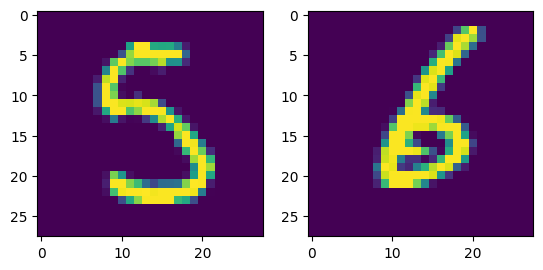

In [5]:
data = iter(mnist_train)
single_point = next(data)
print(f"""Type: {type(single_point)}
Length: {len(single_point)}
More Types: {type(single_point[0])}, {type(single_point[1])}
Shapes: {single_point[0].shape}, {single_point[1].shape}
Labels: {single_point[1]}
""")

# Code to display two images
ToPIL = T.ToPILImage() # Converting function
img0 = ToPIL(single_point[0][0]) # ToPIL will transform the Tensor object back to PIL image
img1 = ToPIL(single_point[0][1])
# Plotting
fig, axs = plt.subplots(1,2)
axs[0].imshow(img0)
axs[1].imshow(img1)

Now we can do the same thing with the CIFAR-10 data.

Type: <class 'list'>
Length: 2
More Types: <class 'torch.Tensor'>, <class 'torch.Tensor'>
Shapes: torch.Size([64, 3, 32, 32]), torch.Size([64])
Labels: tensor([9, 3, 4, 3, 9, 7, 1, 7, 1, 9, 8, 9, 8, 6, 4, 5, 6, 8, 0, 5, 6, 3, 0, 0,
        4, 7, 6, 8, 3, 0, 4, 1, 3, 7, 7, 9, 4, 2, 7, 4, 1, 8, 7, 0, 2, 3, 5, 0,
        9, 9, 1, 4, 4, 4, 2, 1, 0, 9, 8, 5, 1, 0, 7, 1])



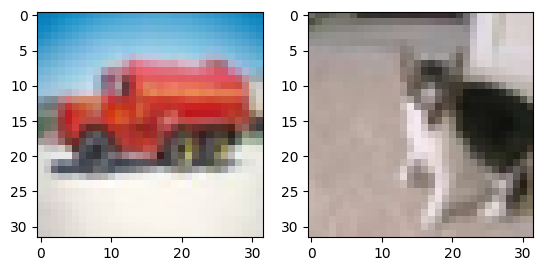

In [6]:
# Code to tell us shape of image data
data = iter(cifar_train)
single_point = next(data)
print(f"""Type: {type(single_point)}
Length: {len(single_point)}
More Types: {type(single_point[0])}, {type(single_point[1])}
Shapes: {single_point[0].shape}, {single_point[1].shape}
Labels: {single_point[1]}
""")

# Code to display two images
ToPIL = T.ToPILImage() # Converting function
img0 = ToPIL(single_point[0][0]) # ToPIL will transform the Tensor object back to PIL image
img1 = ToPIL(single_point[0][1])
# Plotting
fig, axs = plt.subplots(1,2)
axs[0].imshow(img0)
axs[1].imshow(img1)

Let's seed our random processes for the sake of reproducability.

In [7]:
# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


# DCGAN

## General Functions

One thing we can do off the bat is define the latent space which we'll be using for our generative models. Here I used a pretty standard value of 100.

In [8]:
lat_sp = 100

The below function came from the pytorch tutorial and initializes the weights of a nn layer class from the torch libary. The function specifically initializes all weights in convolutional layers with a random value taken from a normal distribution with mean 0.0 and a standard deviation of 0.02 and all weights in batch layers with a random value from a normal distribution centered around 1.0 and with a standard deviation of 0.02.

In [10]:
def init_weights(m):
  classname = m.__class__.__name__
  if classname.find('Conv') != -1:
    nn.init.normal_(m.weight.data, 0.0, 0.02)
  elif classname.find('BatchNorm') != -1:
    nn.init.normal_(m.weight.data, 1.0, 0.02)
    nn.init.constant_(m.bias.data, 0)


One way to see the progress of our generator network in a GAN is to have a fixed noise input and visually see what the generator produces from this signal as it is trained on more and more data. Below we create this fixed noise which is a process that should be reproducable thanks to our random number seeding.

In [12]:
fixed_noise = torch.randn(64, lat_sp, 1, 1, device=device)

Now let's make a training function for GANs. Note that this is separated into several chunks which train both the generator and the discriminator on different types of data that circulate through the network.

In [13]:
real_tag = 1
fake_tag = 0

def train(G_model, D_model, train_data, loss_function, optimizerD, optimizerG, n_epochs=10, latent_vec=100, batch_size=64):

  D_model.train()
  G_model.train()
  res = 0
  step = 1

  for epoch in tqdm(range(n_epochs), desc=f"Epoch", unit="epoch", disable=False):
    for i, data in enumerate(train_data, 0):

      ## Training Discriminator Model ##

      # Training on real data
      D_model.zero_grad()
      real_data = data[0].to(device)
      b = real_data.size(0)
      tag = torch.full((b,), real_tag, dtype=torch.float, device=device)
      #print(real_data.shape)
      output = D_model(real_data).view(-1)
      #print(output.shape)
      lossD_real = loss_function(output, tag)
      lossD_real.backward()
      D_x = output.mean().item()

      # Training on fake data
      noise = torch.randn(b, latent_vec, 1, 1, device=device)
      fake_data = G_model(noise)
      tag.fill_(fake_tag)
      #print(fake_data.shape)
      output = D_model(fake_data.detach()).view(-1)
      lossD_fake = loss_function(output, tag)
      lossD_fake.backward()
      D_G_z1 = output.mean().item()

      # Recording loss
      lossD = lossD_real + lossD_fake
      D_loss_history.append(lossD.item())
      optimizerD.step()

      ## Training Generator Model ##

      G_model.zero_grad()
      tag.fill_(real_tag)
      output = D_model(fake_data).view(-1)
      lossG = loss_function(output, tag)
      lossG.backward()
      D_G_z2 = output.mean().item()
      optimizerG.step()

      G_loss_history.append(lossG.item())

      # Printing out loss progress
      if i % 50 == 0:
        print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f' % (epoch, n_epochs, i, len(train_data),
                                                                                                lossD.item(), lossG.item(), D_x, D_G_z1, D_G_z2))

      if (i % 500 == 0) or ((epoch == n_epochs-1) and (i == len(train_data)-1)):
            with torch.no_grad():
                fake = G_model(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))




Like in the previous homework, we want to create a plot loss function that gives us an idea of how training went after we have trained a model. Unlike the previous homework, here we are plotting two different loss measurements: one for the generator and one for the discriminator.

In [14]:
def plot_loss():
  plt.figure(figsize=(10,5))
  plt.title("Generator and Discriminator Loss During Training")
  plt.plot(G_loss_history,label="G")
  plt.plot(D_loss_history,label="D")
  plt.xlabel("iterations")
  plt.ylabel("Loss")
  plt.legend()
  plt.show()

In order to get an intutive sense of how our models do we can define the function below which shows a progression of the images generated on the fixed noise we defined above. Note that the actual generating using the fixed noise is included in the training function.

In [15]:
def img_progress():
  fig = plt.figure(figsize=(8,8))
  plt.axis("off")
  ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
  ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

  HTML(ani.to_jshtml())


## First Experiment (Following DCGAN Tutorial)

First let's define the generator network which makes up half of our adversarial paradigm.

In [16]:
class Generator(nn.Module):
  def __init__(self, latent_vec, gen_feats, chans):
    super(Generator, self).__init__()
    self.net = nn.Sequential(
        nn.ConvTranspose2d(latent_vec, gen_feats * 8, 4,1,0, bias=False),
        nn.BatchNorm2d(gen_feats * 8),
        nn.ReLU(True),
        nn.ConvTranspose2d(gen_feats*8, gen_feats * 4, 4, 2, 1, bias=False),
        nn.BatchNorm2d(gen_feats * 4),
        nn.ReLU(True),
        nn.ConvTranspose2d(gen_feats * 4, gen_feats*2, 4,2,1, bias=False),
        nn.BatchNorm2d(gen_feats*2),
        nn.ReLU(True),
        nn.ConvTranspose2d(gen_feats*2, gen_feats, 4,2,3, bias=False),
        nn.BatchNorm2d(gen_feats),
        nn.ReLU(True),
        nn.ConvTranspose2d(gen_feats, chans,3,1,1, bias=False),
        nn.Tanh()
    )

  def forward(self, x):
    return self.net(x)

Now let's define our discriminator network.

In [17]:
class Discriminator(nn.Module):
  def __init__(self, dis_feats, chans):
    super(Discriminator, self).__init__()
    self.conv = nn.Sequential(
        # 28 x 28
        nn.Conv2d(chans, dis_feats, 4, 2, 1, bias=False),
        nn.BatchNorm2d(dis_feats),
        nn.LeakyReLU(0.2, inplace=True),
        # 14 x 14
        nn.Conv2d(dis_feats, dis_feats * 2, 4, 2, 1, bias=False),
        nn.BatchNorm2d(dis_feats * 2),
        nn.LeakyReLU(0.2, inplace=True),
        # 7 x 7
        nn.Conv2d(dis_feats * 2, dis_feats * 4, 4, 2, 1, bias=False),
        nn.BatchNorm2d(dis_feats * 4),
        nn.LeakyReLU(0.2, inplace=True),
        # 3 x 3
        nn.Conv2d(dis_feats * 4, 1, 4, 2, 1, bias=False),
        nn.Sigmoid()
        # 1 x 1
    )

  def forward(self, x):
    x = self.conv(x)
    return x

Now that we have the architecture defined, we can instantiate our generator and discriminator networks and initialize their weights.

In [18]:
netG = Generator(latent_vec=lat_sp, gen_feats=28, chans=1).to(device)
netD = Discriminator(dis_feats=28, chans=1).to(device)

netG.apply(init_weights)
netD.apply(init_weights)

Discriminator(
  (conv): Sequential(
    (0): Conv2d(1, 28, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(28, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Conv2d(28, 56, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(56, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Conv2d(56, 112, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(112, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.2, inplace=True)
    (9): Conv2d(112, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): Sigmoid()
  )
)

For our optimizers, we'll use ADAM for the generator and stochastic gradient descent for our discriminator as reccomended in the [ganhacks](https://github.com/soumith/ganhacks) that were referenced in the DCGAN tutorial. Note that the learning rates are different for the two optimizers, this is because different learning rates are better for the two different optimizing algorithms used here.

In [19]:
G_lr = 0.0002
D_lr = 0.02
beta1 = 0.5

optG = optim.Adam(netG.parameters(), lr=G_lr, betas=(beta1, 0.999))
optD = optim.SGD(netD.parameters(), lr=D_lr)
lf = nn.BCELoss()


Now we can do our training computation. Here I will do just 2 epochs of training for the sake of brevity, as an example of this training process.

In [20]:
G_loss_history = []
D_loss_history = []
img_list = []

train(G_model=netG, D_model=netD, train_data=mnist_train, loss_function=lf, optimizerD=optD, optimizerG=optG, n_epochs=2, latent_vec=lat_sp)

Epoch:   0%|          | 0/2 [00:00<?, ?epoch/s]

[0/2][0/938]	Loss_D: 1.3798	Loss_G: 1.5051	D(x): 0.4539	D(G(z)): 0.4292 / 0.2301
[0/2][50/938]	Loss_D: 1.4671	Loss_G: 0.6398	D(x): 0.2683	D(G(z)): 0.0286 / 0.5446
[0/2][100/938]	Loss_D: 1.3682	Loss_G: 0.3272	D(x): 0.2940	D(G(z)): 0.0516 / 0.7375
[0/2][150/938]	Loss_D: 0.8697	Loss_G: 0.4694	D(x): 0.5010	D(G(z)): 0.1069 / 0.6355
[0/2][200/938]	Loss_D: 1.2846	Loss_G: 0.4853	D(x): 0.3464	D(G(z)): 0.0807 / 0.6243
[0/2][250/938]	Loss_D: 0.8759	Loss_G: 0.8182	D(x): 0.4881	D(G(z)): 0.1144 / 0.4682
[0/2][300/938]	Loss_D: 0.6881	Loss_G: 0.8405	D(x): 0.6070	D(G(z)): 0.1317 / 0.4595
[0/2][350/938]	Loss_D: 0.7728	Loss_G: 1.0451	D(x): 0.5419	D(G(z)): 0.1100 / 0.3798
[0/2][400/938]	Loss_D: 1.1041	Loss_G: 6.4243	D(x): 0.9485	D(G(z)): 0.6051 / 0.0024
[0/2][450/938]	Loss_D: 0.3853	Loss_G: 2.0466	D(x): 0.8275	D(G(z)): 0.1674 / 0.1466
[0/2][500/938]	Loss_D: 0.3098	Loss_G: 2.4527	D(x): 0.8661	D(G(z)): 0.1448 / 0.1001
[0/2][550/938]	Loss_D: 0.3559	Loss_G: 1.6999	D(x): 0.7722	D(G(z)): 0.0752 / 0.2024
[0/2][6

Epoch:  50%|█████     | 1/2 [05:00<05:00, 300.84s/epoch]

[1/2][0/938]	Loss_D: 0.4895	Loss_G: 3.2257	D(x): 0.9191	D(G(z)): 0.3137 / 0.0486
[1/2][50/938]	Loss_D: 0.5396	Loss_G: 1.2356	D(x): 0.6586	D(G(z)): 0.0730 / 0.3277
[1/2][100/938]	Loss_D: 2.0401	Loss_G: 0.2154	D(x): 0.1862	D(G(z)): 0.0319 / 0.8176
[1/2][150/938]	Loss_D: 1.4168	Loss_G: 0.5345	D(x): 0.3194	D(G(z)): 0.0673 / 0.6125
[1/2][200/938]	Loss_D: 0.7725	Loss_G: 0.5463	D(x): 0.5846	D(G(z)): 0.1666 / 0.6049
[1/2][250/938]	Loss_D: 0.7624	Loss_G: 3.1063	D(x): 0.9261	D(G(z)): 0.4581 / 0.0555
[1/2][300/938]	Loss_D: 0.7700	Loss_G: 3.5952	D(x): 0.9329	D(G(z)): 0.4621 / 0.0348
[1/2][350/938]	Loss_D: 0.5023	Loss_G: 3.4049	D(x): 0.9261	D(G(z)): 0.3135 / 0.0401
[1/2][400/938]	Loss_D: 0.5453	Loss_G: 2.6613	D(x): 0.8710	D(G(z)): 0.3057 / 0.0850
[1/2][450/938]	Loss_D: 1.2869	Loss_G: 0.7463	D(x): 0.3427	D(G(z)): 0.0408 / 0.5166
[1/2][500/938]	Loss_D: 0.6910	Loss_G: 3.5357	D(x): 0.9341	D(G(z)): 0.4212 / 0.0390
[1/2][550/938]	Loss_D: 1.4822	Loss_G: 0.5761	D(x): 0.3142	D(G(z)): 0.0951 / 0.5927
[1/2][6

Epoch: 100%|██████████| 2/2 [09:57<00:00, 298.85s/epoch]


Now let's visualize the loss of both of our models over time to get a general idea of how the training went.

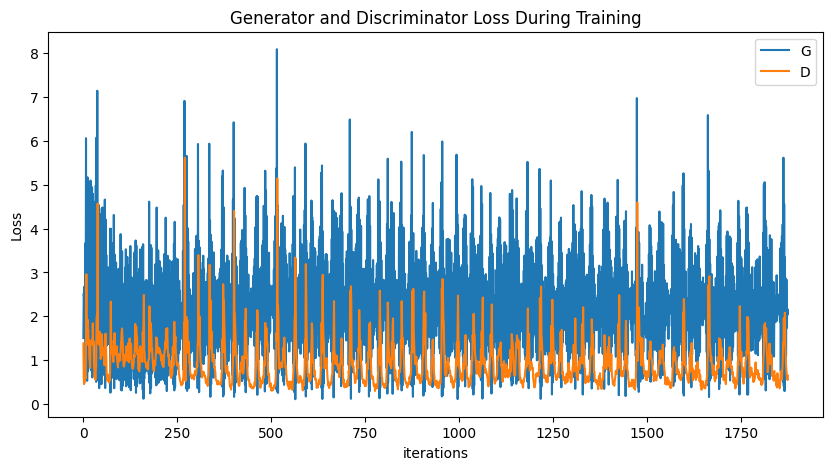

In [21]:
plot_loss()

The loss graph above shows the adversarial dynamic that we see between the generator and discriminator in our GAN. Their loss values oscilate as the generator learns to trick the disciminator and the discriminator learns to spot generated images from the generator.

Another way we can visualize how well our GAN worked out is by showing a progression of the generated images outputted by the generator network on the fixed noise input. If our GAN is working properly, these images should progressively become more convincing replications of the type of data we see in the MNIST data set.

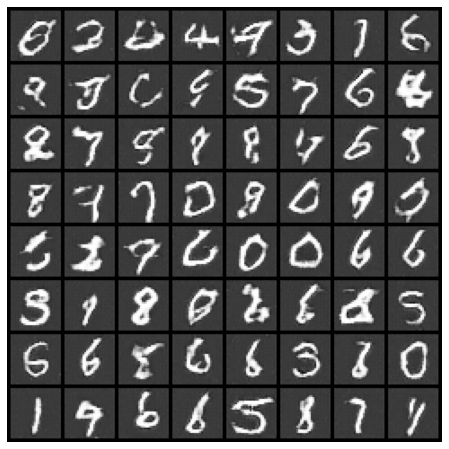

In [ ]:
img_progress()

Notice that the above images after the final iterations of training resemble hand-written numerals, but aren't quite convincing. This is most likely because of the small amount of training we did--if we trained for more epochs we would likely see better results even with this relatively simple network architecture.

## Playing Around



Now that we have proven the concept of a GAN in generating image data, let's try out this method on the slightly more complex dataset of CIFAR-10. The different dimensions of the images requires re-defining our generator and discriminator networks. While we're at it, let's play around with a couple of tweaks to the network architecture we had above. Specifically, I want to introduce dropout and a new activation function (GELU or Gaussian Error Linear Unit).

In [ ]:
class new_Generator(nn.Module):
  def __init__(self, latent_vec, gen_feats, chans):
    super(new_Generator, self).__init__()
    self.net = nn.Sequential(
        # 4 x 4
        nn.ConvTranspose2d(latent_vec, gen_feats * 8, 4,2,1, bias=False),
        nn.BatchNorm2d(gen_feats * 8),
        nn.GELU(),
        nn.Dropout(0.1),
        nn.ConvTranspose2d(gen_feats * 8, gen_feats*4, 4,2,1, bias=False),
        nn.BatchNorm2d(gen_feats * 4),
        nn.GELU(),
        nn.Dropout(0.1),
        # 8 x 8
        nn.ConvTranspose2d(gen_feats*4, gen_feats * 2, 4, 2, 1, bias=False),
        nn.BatchNorm2d(gen_feats * 2),
        nn.GELU(),
        nn.Dropout(0.1),
        # 16 x 16
        nn.ConvTranspose2d(gen_feats * 2, gen_feats, 4,2,1, bias=False),
        nn.BatchNorm2d(gen_feats),
        nn.GELU(),
        nn.Dropout(0.1),
        # 32 x 32
        nn.ConvTranspose2d(gen_feats, chans, 4,2,1, bias=False),
        nn.Tanh()
    )

  def forward(self, x):
    return self.net(x)

As for the discriminator, I decided to keep it relatively similar to the discriminator class we had above. The only changes I made was to change some convolution values so that everything worked with the new image size.

In [ ]:
class new_Discriminator(nn.Module):
  def __init__(self, dis_feats, chans):
    super(new_Discriminator, self).__init__()
    self.conv = nn.Sequential(
        # 32 x 32
        nn.Conv2d(chans, dis_feats, 2, 2, 0, bias=False),
        nn.BatchNorm2d(dis_feats),
        nn.LeakyReLU(0.2, inplace=True),
        # 16 x 16
        nn.Conv2d(dis_feats, dis_feats * 2, 2, 2, 0, bias=False),
        nn.BatchNorm2d(dis_feats * 2),
        nn.LeakyReLU(0.2, inplace=True),
        # 8 x 8
        nn.Conv2d(dis_feats * 2, dis_feats * 4, 2, 2, 0, bias=False),
        nn.BatchNorm2d(dis_feats * 4),
        nn.LeakyReLU(0.2, inplace=True),
        # 4 x 4
        nn.Conv2d(dis_feats * 4, dis_feats*8, 2, 2, 0, bias=False),
        nn.BatchNorm2d(dis_feats * 8),
        nn.LeakyReLU(0.2, inplace=True),
        # 2 x 2
        nn.Conv2d(dis_feats * 8, 1, 1, 2, 0, bias=False),
        nn.Sigmoid()
    )

  def forward(self, x):
    x = self.conv(x)
    return x

Now let's instantiate the new generator and discriminator networks. I kept most of the other factors the same including the initial weights, optimizer choice, and learning rates. Not shown on this document was the trial and error testing I did with learning rates for both the generator and discriminator. In many of my exeriments I would end up getting loss that favored the discriminator heavily and the generator did not learn much at all.

In [ ]:
new_G = new_Generator(latent_vec=lat_sp, gen_feats=32, chans=3).to(device)
new_D = new_Discriminator(dis_feats=32, chans=3).to(device)

new_G.apply(init_weights)
new_D.apply(init_weights)
G_lr = 0.0002
D_lr = 0.02
beta1 = 0.5

optG_2 = optim.Adam(new_G.parameters(), lr=G_lr, betas=(beta1, 0.999))
optD_2 = optim.SGD(new_D.parameters(), lr=D_lr)
lf_2 = nn.BCELoss()

Now we can train our GAN with the following code snippet. I played around with a few different number of epochs, but kept getting subpar results. Finally, I set the number of epochs to 10 to see if I just needed more training time.

In [ ]:
G_loss_history = []
D_loss_history = []
img_list = []

train(G_model=new_G, D_model=new_D, train_data=cifar_train, loss_function=lf_2, optimizerD=optD_2, optimizerG=optG_2, n_epochs=10, latent_vec=lat_sp)

Epoch:   0%|          | 0/10 [00:00<?, ?epoch/s]

[0/10][0/782]	Loss_D: 1.4567	Loss_G: 1.0163	D(x): 0.4492	D(G(z)): 0.4749 / 0.3656
[0/10][50/782]	Loss_D: 1.2208	Loss_G: 2.3848	D(x): 0.6410	D(G(z)): 0.4468 / 0.1149
[0/10][100/782]	Loss_D: 0.9712	Loss_G: 1.4022	D(x): 0.6561	D(G(z)): 0.3581 / 0.2586
[0/10][150/782]	Loss_D: 0.9464	Loss_G: 1.4945	D(x): 0.6775	D(G(z)): 0.3430 / 0.2509
[0/10][200/782]	Loss_D: 0.9279	Loss_G: 1.5386	D(x): 0.6733	D(G(z)): 0.2857 / 0.2244
[0/10][250/782]	Loss_D: 0.9907	Loss_G: 1.5863	D(x): 0.6537	D(G(z)): 0.3355 / 0.2149
[0/10][300/782]	Loss_D: 0.7923	Loss_G: 1.5162	D(x): 0.7509	D(G(z)): 0.2909 / 0.2238
[0/10][350/782]	Loss_D: 1.1676	Loss_G: 1.7247	D(x): 0.6778	D(G(z)): 0.2846 / 0.1922
[0/10][400/782]	Loss_D: 0.8996	Loss_G: 1.9140	D(x): 0.7324	D(G(z)): 0.2693 / 0.2254
[0/10][450/782]	Loss_D: 0.9144	Loss_G: 1.7362	D(x): 0.7107	D(G(z)): 0.2702 / 0.1899
[0/10][500/782]	Loss_D: 0.8440	Loss_G: 2.0910	D(x): 0.7789	D(G(z)): 0.2678 / 0.1352
[0/10][550/782]	Loss_D: 1.2544	Loss_G: 2.2611	D(x): 0.6882	D(G(z)): 0.3075 / 0.

Epoch:  10%|█         | 1/10 [05:07<46:11, 307.97s/epoch]

[1/10][0/782]	Loss_D: 0.8931	Loss_G: 1.7004	D(x): 0.6961	D(G(z)): 0.2479 / 0.2071
[1/10][50/782]	Loss_D: 0.6866	Loss_G: 2.1181	D(x): 0.7918	D(G(z)): 0.2903 / 0.1444
[1/10][100/782]	Loss_D: 0.7442	Loss_G: 2.1446	D(x): 0.7953	D(G(z)): 0.2458 / 0.1451
[1/10][150/782]	Loss_D: 0.9775	Loss_G: 1.8042	D(x): 0.6377	D(G(z)): 0.2406 / 0.1908
[1/10][200/782]	Loss_D: 1.0015	Loss_G: 1.4713	D(x): 0.6029	D(G(z)): 0.3066 / 0.2959
[1/10][250/782]	Loss_D: 1.1934	Loss_G: 1.8681	D(x): 0.7529	D(G(z)): 0.4991 / 0.2256
[1/10][300/782]	Loss_D: 0.8529	Loss_G: 1.6507	D(x): 0.7141	D(G(z)): 0.3407 / 0.2316
[1/10][350/782]	Loss_D: 1.0174	Loss_G: 2.0587	D(x): 0.7424	D(G(z)): 0.4104 / 0.1763
[1/10][400/782]	Loss_D: 0.9866	Loss_G: 1.7072	D(x): 0.5888	D(G(z)): 0.2799 / 0.2134
[1/10][450/782]	Loss_D: 0.7292	Loss_G: 1.6421	D(x): 0.6981	D(G(z)): 0.2335 / 0.2379
[1/10][500/782]	Loss_D: 0.9573	Loss_G: 1.9658	D(x): 0.7698	D(G(z)): 0.4404 / 0.1775
[1/10][550/782]	Loss_D: 1.0333	Loss_G: 1.7036	D(x): 0.7340	D(G(z)): 0.4388 / 0.

Epoch:  20%|██        | 2/10 [10:37<42:45, 320.68s/epoch]

[2/10][0/782]	Loss_D: 0.9904	Loss_G: 1.8673	D(x): 0.7526	D(G(z)): 0.4143 / 0.2031
[2/10][50/782]	Loss_D: 0.9976	Loss_G: 1.5798	D(x): 0.6389	D(G(z)): 0.3571 / 0.2267
[2/10][100/782]	Loss_D: 1.0227	Loss_G: 2.0416	D(x): 0.7003	D(G(z)): 0.4124 / 0.1674
[2/10][150/782]	Loss_D: 1.3508	Loss_G: 1.5612	D(x): 0.4452	D(G(z)): 0.2734 / 0.3054
[2/10][200/782]	Loss_D: 1.5282	Loss_G: 1.0552	D(x): 0.3279	D(G(z)): 0.2461 / 0.4580
[2/10][250/782]	Loss_D: 1.1169	Loss_G: 1.1097	D(x): 0.4648	D(G(z)): 0.2044 / 0.3793
[2/10][300/782]	Loss_D: 1.0387	Loss_G: 1.6566	D(x): 0.6577	D(G(z)): 0.3750 / 0.2291
[2/10][350/782]	Loss_D: 0.9220	Loss_G: 1.5780	D(x): 0.6638	D(G(z)): 0.3446 / 0.2313
[2/10][400/782]	Loss_D: 1.0835	Loss_G: 1.4539	D(x): 0.6818	D(G(z)): 0.4310 / 0.2575
[2/10][450/782]	Loss_D: 1.0419	Loss_G: 1.4999	D(x): 0.6561	D(G(z)): 0.3717 / 0.2586
[2/10][500/782]	Loss_D: 1.1056	Loss_G: 1.7707	D(x): 0.6420	D(G(z)): 0.4166 / 0.2156
[2/10][550/782]	Loss_D: 1.0307	Loss_G: 2.1008	D(x): 0.7662	D(G(z)): 0.4754 / 0.

Epoch:  30%|███       | 3/10 [16:24<38:49, 332.82s/epoch]

[3/10][0/782]	Loss_D: 1.1201	Loss_G: 1.4688	D(x): 0.6178	D(G(z)): 0.3770 / 0.2626
[3/10][50/782]	Loss_D: 1.0094	Loss_G: 1.8089	D(x): 0.7141	D(G(z)): 0.4264 / 0.1968
[3/10][100/782]	Loss_D: 1.2064	Loss_G: 1.4661	D(x): 0.5972	D(G(z)): 0.3559 / 0.2941
[3/10][150/782]	Loss_D: 1.1471	Loss_G: 1.6266	D(x): 0.6947	D(G(z)): 0.4685 / 0.2425
[3/10][200/782]	Loss_D: 1.0811	Loss_G: 1.4640	D(x): 0.6386	D(G(z)): 0.4060 / 0.2595
[3/10][250/782]	Loss_D: 1.0365	Loss_G: 1.5520	D(x): 0.6535	D(G(z)): 0.3539 / 0.2381
[3/10][300/782]	Loss_D: 1.0629	Loss_G: 1.1202	D(x): 0.5717	D(G(z)): 0.3011 / 0.3782
[3/10][350/782]	Loss_D: 1.0119	Loss_G: 1.3499	D(x): 0.6213	D(G(z)): 0.3654 / 0.2772
[3/10][400/782]	Loss_D: 1.2335	Loss_G: 1.6188	D(x): 0.6272	D(G(z)): 0.4183 / 0.2236
[3/10][450/782]	Loss_D: 1.1351	Loss_G: 1.2421	D(x): 0.4994	D(G(z)): 0.2727 / 0.3315
[3/10][500/782]	Loss_D: 1.2455	Loss_G: 1.2276	D(x): 0.4966	D(G(z)): 0.3361 / 0.3395
[3/10][550/782]	Loss_D: 0.9507	Loss_G: 1.7248	D(x): 0.6808	D(G(z)): 0.3606 / 0.

Epoch:  40%|████      | 4/10 [21:59<33:21, 333.60s/epoch]

[4/10][0/782]	Loss_D: 1.4419	Loss_G: 0.7604	D(x): 0.3521	D(G(z)): 0.1965 / 0.5225
[4/10][50/782]	Loss_D: 0.8544	Loss_G: 1.6920	D(x): 0.7458	D(G(z)): 0.3601 / 0.2080
[4/10][100/782]	Loss_D: 1.0877	Loss_G: 1.2196	D(x): 0.5922	D(G(z)): 0.3528 / 0.3405
[4/10][150/782]	Loss_D: 1.2983	Loss_G: 0.8176	D(x): 0.4113	D(G(z)): 0.2249 / 0.4912
[4/10][200/782]	Loss_D: 0.8494	Loss_G: 1.6963	D(x): 0.6861	D(G(z)): 0.3266 / 0.2017
[4/10][250/782]	Loss_D: 0.9814	Loss_G: 1.8064	D(x): 0.7367	D(G(z)): 0.4308 / 0.1905
[4/10][300/782]	Loss_D: 0.9913	Loss_G: 1.6498	D(x): 0.7698	D(G(z)): 0.4611 / 0.2198
[4/10][350/782]	Loss_D: 0.9665	Loss_G: 1.5630	D(x): 0.7122	D(G(z)): 0.4085 / 0.2289
[4/10][400/782]	Loss_D: 1.0350	Loss_G: 1.2616	D(x): 0.5420	D(G(z)): 0.2529 / 0.3123
[4/10][450/782]	Loss_D: 1.0705	Loss_G: 1.4613	D(x): 0.5901	D(G(z)): 0.3297 / 0.2660
[4/10][500/782]	Loss_D: 1.4160	Loss_G: 0.9002	D(x): 0.4052	D(G(z)): 0.2764 / 0.4701
[4/10][550/782]	Loss_D: 1.3825	Loss_G: 0.9949	D(x): 0.3878	D(G(z)): 0.2434 / 0.

Epoch:  50%|█████     | 5/10 [27:42<28:05, 337.02s/epoch]

[5/10][0/782]	Loss_D: 1.0301	Loss_G: 1.6576	D(x): 0.6762	D(G(z)): 0.4037 / 0.2155
[5/10][50/782]	Loss_D: 0.9224	Loss_G: 1.2077	D(x): 0.5858	D(G(z)): 0.2620 / 0.3386
[5/10][100/782]	Loss_D: 1.0428	Loss_G: 1.5201	D(x): 0.6433	D(G(z)): 0.3601 / 0.2492
[5/10][150/782]	Loss_D: 1.2959	Loss_G: 1.2214	D(x): 0.4310	D(G(z)): 0.2443 / 0.3484
[5/10][200/782]	Loss_D: 1.0163	Loss_G: 1.5265	D(x): 0.6069	D(G(z)): 0.3305 / 0.2427
[5/10][250/782]	Loss_D: 0.9684	Loss_G: 1.2244	D(x): 0.5689	D(G(z)): 0.2665 / 0.3417
[5/10][300/782]	Loss_D: 0.9332	Loss_G: 1.3965	D(x): 0.6692	D(G(z)): 0.3598 / 0.2622
[5/10][350/782]	Loss_D: 1.1652	Loss_G: 1.1368	D(x): 0.5066	D(G(z)): 0.2652 / 0.4237
[5/10][400/782]	Loss_D: 0.9872	Loss_G: 1.4015	D(x): 0.5958	D(G(z)): 0.3101 / 0.2832
[5/10][450/782]	Loss_D: 0.9146	Loss_G: 1.6978	D(x): 0.7072	D(G(z)): 0.3643 / 0.2091
[5/10][500/782]	Loss_D: 1.5311	Loss_G: 1.8711	D(x): 0.7538	D(G(z)): 0.5992 / 0.2049
[5/10][550/782]	Loss_D: 1.0275	Loss_G: 1.6306	D(x): 0.6278	D(G(z)): 0.3650 / 0.

Epoch:  60%|██████    | 6/10 [33:05<22:09, 332.35s/epoch]

[6/10][0/782]	Loss_D: 1.3835	Loss_G: 1.9006	D(x): 0.7055	D(G(z)): 0.4906 / 0.2086
[6/10][50/782]	Loss_D: 1.1416	Loss_G: 2.1332	D(x): 0.6505	D(G(z)): 0.4152 / 0.1438
[6/10][100/782]	Loss_D: 0.9768	Loss_G: 1.6581	D(x): 0.6457	D(G(z)): 0.3385 / 0.2241
[6/10][150/782]	Loss_D: 0.7179	Loss_G: 1.6678	D(x): 0.7634	D(G(z)): 0.3148 / 0.2121
[6/10][200/782]	Loss_D: 0.9954	Loss_G: 2.2535	D(x): 0.7081	D(G(z)): 0.4220 / 0.1418
[6/10][250/782]	Loss_D: 1.0168	Loss_G: 1.2178	D(x): 0.5988	D(G(z)): 0.3163 / 0.3317
[6/10][300/782]	Loss_D: 0.9294	Loss_G: 1.3689	D(x): 0.6404	D(G(z)): 0.3010 / 0.3003
[6/10][350/782]	Loss_D: 1.1379	Loss_G: 2.0756	D(x): 0.7548	D(G(z)): 0.4687 / 0.1584
[6/10][400/782]	Loss_D: 1.0064	Loss_G: 1.2640	D(x): 0.5638	D(G(z)): 0.2554 / 0.3499
[6/10][450/782]	Loss_D: 0.9680	Loss_G: 1.7804	D(x): 0.7510	D(G(z)): 0.4240 / 0.1912
[6/10][500/782]	Loss_D: 1.0424	Loss_G: 1.1186	D(x): 0.5776	D(G(z)): 0.3161 / 0.3679
[6/10][550/782]	Loss_D: 1.1357	Loss_G: 1.2669	D(x): 0.5327	D(G(z)): 0.2942 / 0.

Epoch:  70%|███████   | 7/10 [37:56<15:55, 318.62s/epoch]

[7/10][0/782]	Loss_D: 1.1094	Loss_G: 0.9941	D(x): 0.5706	D(G(z)): 0.2966 / 0.4154
[7/10][50/782]	Loss_D: 1.0193	Loss_G: 1.1267	D(x): 0.5593	D(G(z)): 0.2534 / 0.3548
[7/10][100/782]	Loss_D: 0.6448	Loss_G: 1.7584	D(x): 0.7632	D(G(z)): 0.2656 / 0.1890
[7/10][150/782]	Loss_D: 1.1776	Loss_G: 0.9832	D(x): 0.4555	D(G(z)): 0.2173 / 0.4506
[7/10][200/782]	Loss_D: 0.8092	Loss_G: 1.3026	D(x): 0.6000	D(G(z)): 0.2029 / 0.3631
[7/10][250/782]	Loss_D: 0.9251	Loss_G: 1.8379	D(x): 0.7931	D(G(z)): 0.4264 / 0.1904
[7/10][300/782]	Loss_D: 1.1120	Loss_G: 2.3272	D(x): 0.7459	D(G(z)): 0.4609 / 0.1419
[7/10][350/782]	Loss_D: 1.0182	Loss_G: 2.0697	D(x): 0.6866	D(G(z)): 0.3857 / 0.1586
[7/10][400/782]	Loss_D: 0.7437	Loss_G: 1.8377	D(x): 0.7036	D(G(z)): 0.2661 / 0.1817
[7/10][450/782]	Loss_D: 0.8910	Loss_G: 1.9354	D(x): 0.7370	D(G(z)): 0.3581 / 0.1783
[7/10][500/782]	Loss_D: 0.8960	Loss_G: 1.0639	D(x): 0.5643	D(G(z)): 0.1807 / 0.3836
[7/10][550/782]	Loss_D: 0.9917	Loss_G: 2.2546	D(x): 0.8236	D(G(z)): 0.4658 / 0.

Epoch:  80%|████████  | 8/10 [43:19<10:40, 320.14s/epoch]

[8/10][0/782]	Loss_D: 2.0007	Loss_G: 1.9171	D(x): 0.8511	D(G(z)): 0.6783 / 0.2066
[8/10][50/782]	Loss_D: 1.0763	Loss_G: 1.5400	D(x): 0.5607	D(G(z)): 0.2390 / 0.2480
[8/10][100/782]	Loss_D: 0.8685	Loss_G: 1.4868	D(x): 0.5996	D(G(z)): 0.2102 / 0.2791
[8/10][150/782]	Loss_D: 0.8412	Loss_G: 1.4138	D(x): 0.5937	D(G(z)): 0.1696 / 0.2867
[8/10][200/782]	Loss_D: 1.0437	Loss_G: 1.0400	D(x): 0.5084	D(G(z)): 0.2143 / 0.4219
[8/10][250/782]	Loss_D: 0.9270	Loss_G: 1.1121	D(x): 0.5761	D(G(z)): 0.2513 / 0.4128
[8/10][300/782]	Loss_D: 0.9650	Loss_G: 1.1199	D(x): 0.5416	D(G(z)): 0.1851 / 0.4074
[8/10][350/782]	Loss_D: 0.8802	Loss_G: 1.7840	D(x): 0.7250	D(G(z)): 0.3474 / 0.1980
[8/10][400/782]	Loss_D: 1.0391	Loss_G: 1.3319	D(x): 0.5356	D(G(z)): 0.2041 / 0.3204
[8/10][450/782]	Loss_D: 0.8759	Loss_G: 2.4262	D(x): 0.7794	D(G(z)): 0.3843 / 0.1302
[8/10][500/782]	Loss_D: 0.7609	Loss_G: 1.8752	D(x): 0.7230	D(G(z)): 0.2743 / 0.1826
[8/10][550/782]	Loss_D: 0.9503	Loss_G: 2.3579	D(x): 0.8296	D(G(z)): 0.4666 / 0.

Epoch:  90%|█████████ | 9/10 [48:49<05:23, 323.09s/epoch]

[9/10][0/782]	Loss_D: 0.8435	Loss_G: 2.2294	D(x): 0.7827	D(G(z)): 0.3700 / 0.1451
[9/10][50/782]	Loss_D: 0.8957	Loss_G: 1.7768	D(x): 0.7364	D(G(z)): 0.3292 / 0.2000
[9/10][100/782]	Loss_D: 1.2939	Loss_G: 0.9542	D(x): 0.4240	D(G(z)): 0.2055 / 0.4683
[9/10][150/782]	Loss_D: 0.9020	Loss_G: 2.1266	D(x): 0.8074	D(G(z)): 0.3722 / 0.1449
[9/10][200/782]	Loss_D: 0.8366	Loss_G: 1.3275	D(x): 0.5807	D(G(z)): 0.1805 / 0.3126
[9/10][250/782]	Loss_D: 0.9427	Loss_G: 1.8468	D(x): 0.7055	D(G(z)): 0.3566 / 0.1911
[9/10][300/782]	Loss_D: 0.9074	Loss_G: 1.3070	D(x): 0.5631	D(G(z)): 0.2110 / 0.3265
[9/10][350/782]	Loss_D: 0.8261	Loss_G: 1.8168	D(x): 0.6349	D(G(z)): 0.2247 / 0.2126
[9/10][400/782]	Loss_D: 0.8000	Loss_G: 1.5747	D(x): 0.6313	D(G(z)): 0.1746 / 0.2340
[9/10][450/782]	Loss_D: 1.1271	Loss_G: 1.0833	D(x): 0.4901	D(G(z)): 0.2287 / 0.3915
[9/10][500/782]	Loss_D: 0.8271	Loss_G: 1.1893	D(x): 0.6632	D(G(z)): 0.2640 / 0.3532
[9/10][550/782]	Loss_D: 0.8405	Loss_G: 1.9012	D(x): 0.7112	D(G(z)): 0.2544 / 0.

Epoch: 100%|██████████| 10/10 [53:53<00:00, 323.37s/epoch]


This training routine took about an hour to complete, but just from the recorded loss values it seemed to have a lot more promise than my past training attempts which would end with things like the discriminator consistenly having very low loss. Let's plot the loss for both networks to see how this process went in a visual sense.

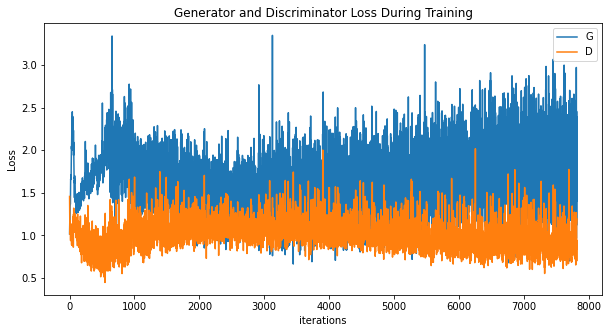

In [ ]:
plot_loss()

We can again see the trade off between the generator and discriminator learning from each other in the adversarial framework. We see a lot of noise in this graph as well---this is something that could likely be reduced by tweaking the architectures of the networks and the learning rates/optimizers they use. I would play around with these factors more, but I don't necessarily have the time when training takes about an hour.

For a final sanity check on our model, let's print out the progression of our generator network on the fixed noise which we used to analyze our MNIST results above.

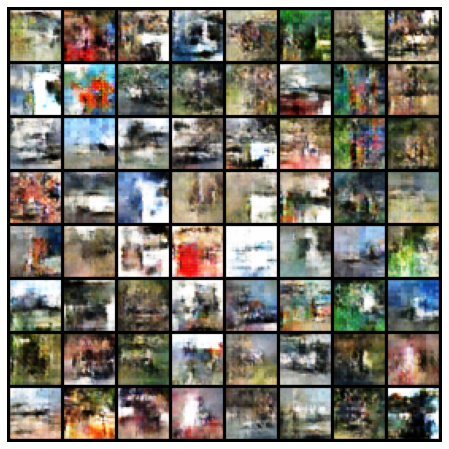

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

The final result shown above is a somewhat convincing collection of blurry photos! I would not say that this generative network is state of the art by any means, but it is cool to see the network be able to produce something that emulates what we expect to see in reality.

I believe the results could be improved greatly if more training were done or potentially if certain hyperparameters had been set to more optimal values. However, due to the much greater computational complexity that comes with just this slight increase in data complexity, it is much harder to get convincing results than with the MNIST data.

# PCA

## Some General Functions

Because we'll be revisiting linear networks in this section, let's begin by defining some general re-usable functions from HW #1 which will make playing around with our PCA algorithms much easier. First, below we have a training function---this training function is essentially the exact same as what we had in HW #1.

In [ ]:
def train(model, learning_rate, n_epochs, loss_function, optimizer, train_data, lr_sched=False, scheduler=None):

  model.train()
  loss_history = []
  loss = torch.Tensor([0])
  for epoch in tqdm(range(n_epochs), desc=f"Epoch", unit="epoch", disable=False):
    for (data, label) in train_data:
        optimizer.zero_grad() # Clear the gradients

        # We need to make sure the tensors are on the same device as our model
        data = data.to(device)
        label = label.to(device)
        #print(data.shape)
        out = model(data)

        loss = loss_function(out, label)

        loss.backward()
        optimizer.step()
        loss_history.append(loss.item())
    print(f"Epoch {epoch}: loss: {loss.item()}")
    if (lr_sched):
      scheduler.step()

  return loss_history

Here we can define a basic fully connected linear network.

In [ ]:
class BasicNN(nn.Module):

  def __init__(self, n_inputs=3*32*32, n_hidden=1024, n_out=10):
    super().__init__()
    self.net = nn.Sequential(
        nn.Linear(n_inputs, n_hidden),
        nn.ReLU(),
        nn.Linear(n_hidden, n_hidden),
        nn.ReLU(),
        nn.Linear(n_hidden, n_hidden),
        nn.ReLU(),
        nn.Linear(n_hidden, n_out),
        nn.Sigmoid()
    )

  def forward(self, x):
    # Batch, channel, height, width
    b, c, h, w = x.shape
    # Flatten the image
    x = x.view(b,-1)
    # Put flattened image through the network
    x = self.net(x)
    return x

Also from HW #1 we have a function that plots the loss history of a network over training iterations as well as a function that tests the accuracy of a model in a classification task. Both of these functions will be used to evaluate the performance of linear models before and after applying a PCA transform to the data that is being used for training and testing purposes.

In [ ]:
def show_loss_history(lh):
  plt.plot(lh)
  plt.title("Neural Network Loss")
  plt.xlabel("Number of iterations")
  plt.ylabel("Loss")
  plt.show()

def test_accuracy(model, test_data, ref_dataset):
  model.eval()
  accuracy = 0
  for (data, label) in test_data:
    data = data.to(device)
    label = label.to(device)
    out = model(data)
    answers = out.max(dim=1)[1]
    accuracy += (answers == label).sum()
  print(f"Total accuracy = {accuracy / len(ref_dataset)*100:.2f}%")


## Using sklearn's PCA

To start out with, let's try to play around with sklearn's PCA algorithm to get some experience using this type of algorithm. Below I have coded I quick demonstration where we reduce the dimensionality of the red channel of a CIFAR image to (10,32) instead of (32,32). We then use the PCA's inverse transform method to recover the (32,32) image.

Comparing the compressed and recovered images gives us some intution on what kind of information compression with PCA reduces.

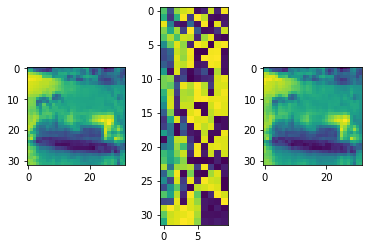

In [ ]:
from sklearn.decomposition import PCA

tense = T.ToTensor()

# First define our PCA from sklearn library
pca = PCA(n_components=10)

# Next let's look at a single point from the CIFAR dataset
test_point = (single_point[0][0])
#print(test_point.shape)

# We then do PCA on each of the channels
r = (test_point[0])
test_pca = pca.fit_transform(r)
recovered_r = pca.inverse_transform(test_pca)

img0 = ToPIL(r)
img1 = ToPIL(tense(test_pca))
img2 = ToPIL(tense(recovered_r))
fig, axs = plt.subplots(1,3)

axs[0].imshow(img0)
axs[1].imshow(img1)
axs[2].imshow(img2)
#print(test_pca.shape)

Now let's write a function that does principal component analysis on each of the 3 channels in an RGB image and then recombines them. I have also included an "inverse" option which makes the function invert the PCA transformation. This allows us to gain some intutition on the effect principal component analysis is having on our data.

In [ ]:
def apply_PCA(rgb_tensor, n_comps, inverse=False):
  tense = T.ToTensor()
  pca = PCA(n_components=n_comps)
  r = rgb_tensor[0]; g = rgb_tensor[1]; b = rgb_tensor[2]

  r_compressed = pca.fit_transform(r)
  g_compressed = pca.fit_transform(g)
  b_compressed = pca.fit_transform(b)

  ret_img = torch.stack((tense(r_compressed), tense(g_compressed), tense(b_compressed)), 1)

  if (inverse):
    r_recov = tense(pca.inverse_transform(r_compressed))
    g_recov = tense(pca.inverse_transform(g_compressed))
    b_recov = tense(pca.inverse_transform(b_compressed))

    ret_img = torch.stack((r_recov, g_recov, b_recov), 1)

  return ret_img

Now we can test out our PCA function by using the inverse image option which will reverse the PCA compression and show us kind of information the algorithm preserves.

torch.Size([1, 3, 32, 32])


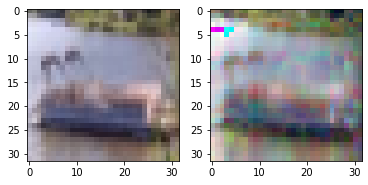

In [ ]:
recov_img = apply_PCA(test_point, 16, inverse=True)

print(recov_img.shape)

img0 = ToPIL(test_point)
img1 = ToPIL(recov_img[0])
fig, axs = plt.subplots(1,2)

axs[0].imshow(img0)
axs[1].imshow(img1)

Now let's define and train a linear network for classifying CIFAR-10 images.

In [ ]:
lr_1 = 0.05
model_1 = BasicNN(n_inputs=3*32*32, n_out=10, n_hidden=2048).to(device)
opt_1 = optim.SGD(model_1.parameters(), lr=lr_1)
lf_1 = nn.CrossEntropyLoss()

loss_history = train(model=model_1, learning_rate=lr_1, n_epochs=10, loss_function=lf_1, optimizer=opt_1, train_data=cifar_train)

Epoch:  10%|█         | 1/10 [01:52<16:56, 112.98s/epoch]

Epoch 0: loss: 2.0866429805755615


Epoch:  20%|██        | 2/10 [03:51<15:30, 116.32s/epoch]

Epoch 1: loss: 2.0935702323913574


Epoch:  30%|███       | 3/10 [05:48<13:36, 116.70s/epoch]

Epoch 2: loss: 1.9362585544586182


Epoch:  40%|████      | 4/10 [07:42<11:32, 115.49s/epoch]

Epoch 3: loss: 2.0829901695251465


Epoch:  50%|█████     | 5/10 [09:37<09:36, 115.25s/epoch]

Epoch 4: loss: 1.9625585079193115


Epoch:  60%|██████    | 6/10 [11:30<07:38, 114.58s/epoch]

Epoch 5: loss: 2.052839994430542


Epoch:  70%|███████   | 7/10 [13:25<05:43, 114.56s/epoch]

Epoch 6: loss: 2.0590641498565674


Epoch:  80%|████████  | 8/10 [15:17<03:47, 113.94s/epoch]

Epoch 7: loss: 1.8869434595108032


Epoch:  90%|█████████ | 9/10 [17:11<01:53, 113.92s/epoch]

Epoch 8: loss: 1.9445463418960571


Epoch: 100%|██████████| 10/10 [19:03<00:00, 114.38s/epoch]

Epoch 9: loss: 2.1431314945220947


We can do a quick check to see how this training went by plotting the loss history of the network.

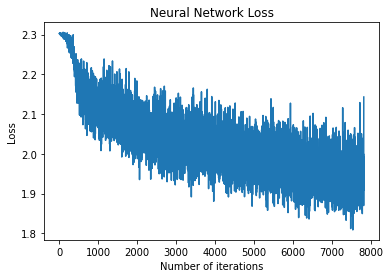

In [ ]:
show_loss_history(loss_history)

The above graph shows a lot of noise in the loss trend (perhaps an indication of a too high learning rate). We also generally wouldn't look at this and conclude our model has converged; however, for the purposes of our experiment we don't necessarily need a great model because even with low accuracy we can compare between models and see the effects of applying PCA.

The code below tests the accuracy of this first model. This statistic by itself isn't of much interest to us, instead we want to compare it with the accuracy values we get below.

In [ ]:
test_accuracy(model_1, cifar_test, ref_dataset=cifar_dataset_test)

Total accuracy = 24.63%


Now we want to see how our model is affected if we compress our images using PCA. To experiment with this, we first need to construct a training and testing data set of compressed images. Below we have a couple of for loops to make these datasets--specifically with (32x10) images created using sklearn's PCA.

In [ ]:
nc = 10
compr_dataset_train = []
compr_dataset_test = []

for item in cifar_dataset_train:
  mat = item[0]
  tag = item[1]
  new_mat = (apply_PCA(mat, n_comps=nc)).squeeze()
  new_mat = new_mat.to(torch.float32)
  #print(new_mat.shape)
  compr_dataset_train.append((new_mat, tag))


for item in cifar_dataset_test:
  mat = item[0]
  tag = item[1]
  new_mat = (apply_PCA(mat, n_comps=nc)).squeeze()
  new_mat = new_mat.to(torch.float32)
  #print(new_mat.shape)
  compr_dataset_test.append((new_mat, tag))

compr_train = DataLoader(compr_dataset_train, batch_size=b_size, shuffle=True)
compr_test = DataLoader(compr_dataset_test, batch_size=b_size, shuffle=True)

Now that we have our data sets, we can try creating a model trained on these compressed images and see how accurately it can classify similar compressed images from the compressed test data set.

In [ ]:
lr_2 = 0.05
model_2 = BasicNN(n_inputs=3*32*10, n_out=10, n_hidden=2048).to(device)
opt_2 = optim.SGD(model_2.parameters(), lr=lr_2)
lf_2 = nn.CrossEntropyLoss()

loss_history2 = train(model=model_2, learning_rate=lr_2, n_epochs=10, loss_function=lf_2, optimizer=opt_2, train_data=compr_train)

Epoch:  10%|█         | 1/10 [01:27<13:10, 87.83s/epoch]

Epoch 0: loss: 2.2784385681152344


Epoch:  20%|██        | 2/10 [02:50<11:20, 85.07s/epoch]

Epoch 1: loss: 2.201200008392334


Epoch:  30%|███       | 3/10 [04:15<09:55, 85.01s/epoch]

Epoch 2: loss: 2.223842144012451


Epoch:  40%|████      | 4/10 [05:40<08:28, 84.73s/epoch]

Epoch 3: loss: 2.2423980236053467


Epoch:  50%|█████     | 5/10 [07:03<07:01, 84.36s/epoch]

Epoch 4: loss: 2.161604881286621


Epoch:  60%|██████    | 6/10 [08:29<05:38, 84.63s/epoch]

Epoch 5: loss: 2.156322956085205


Epoch:  70%|███████   | 7/10 [09:53<04:13, 84.49s/epoch]

Epoch 6: loss: 2.142328977584839


Epoch:  80%|████████  | 8/10 [11:17<02:48, 84.40s/epoch]

Epoch 7: loss: 2.105769634246826


Epoch:  90%|█████████ | 9/10 [12:39<01:23, 83.65s/epoch]

Epoch 8: loss: 2.128302812576294


Epoch: 100%|██████████| 10/10 [14:02<00:00, 84.23s/epoch]

Epoch 9: loss: 2.0094199180603027


One thing we can note right off the bat is that this network took a noticably shorter time to train. This is a very useful trait for neural networks especially in our case where time is often a limiting factor.

Once again, let's take a look at the loss plot as a sanity check for the effectiveness of this model.

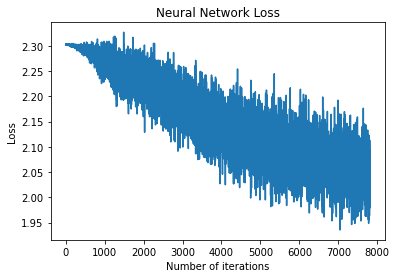

In [ ]:
show_loss_history(loss_history2)

The above graph suggests that this model may be even further from convergernce than the previously trained one. This is practically less of an issue here because the quicker training time means we can more easily increase the number of epochs to reach some sort of convergence.

Now the faster training time doesn't mean much if we have to sacrifice accuracy, so let's use our function to test how accurately we can do the CIFAR classifcation task.

In [ ]:
test_accuracy(model_2, compr_test, ref_dataset=cifar_dataset_test)

Total accuracy = 27.74%


Turns out got an even higher accuracy score! Now it should be noted that on networks not quite trained to convergence and this relatively small dataset, that a 3% increase is not significant enough to prove that it is more effective. However, it does suggest that this model may be about the same level of effectiveness. This is cool because this one was much faster to train.

Now let's push this idea to the extreme and compress the images even further. Below I have created new datasets with pictures that have been reduced to (32x3) by our PCA algorithm.

In [ ]:
nc = 3
compr_dataset_test_2 = []
compr_dataset_train_2 = []

for item in cifar_dataset_train:
  mat = item[0]
  tag = item[1]
  new_mat = (apply_PCA(mat, n_comps=nc)).squeeze()
  new_mat = new_mat.to(torch.float32)
  #print(new_mat.shape)
  compr_dataset_train_2.append((new_mat, tag))

for item in cifar_dataset_test:
  mat = item[0]
  tag = item[1]
  new_mat = (apply_PCA(mat, n_comps=nc)).squeeze()
  new_mat = new_mat.to(torch.float32)
  #print(new_mat.shape)
  compr_dataset_test_2.append((new_mat, tag))

compr_train_2 = DataLoader(compr_dataset_train_2, batch_size=b_size, shuffle=True)
compr_test_2 = DataLoader(compr_dataset_test_2, batch_size=b_size, shuffle=True)

Now let's train a model based on these compressed images.

In [ ]:
lr_3 = 0.05
model_3 = BasicNN(n_inputs=3*32*3, n_out=10, n_hidden=2048).to(device)
opt_3 = optim.SGD(model_3.parameters(), lr=lr_3)
lf_3 = nn.CrossEntropyLoss()

loss_history3 = train(model=model_3, learning_rate=lr_3, n_epochs=10, loss_function=lf_3, optimizer=opt_3, train_data=compr_train_2)

Epoch:  10%|█         | 1/10 [01:20<12:03, 80.43s/epoch]

Epoch 0: loss: 2.305504322052002


Epoch:  20%|██        | 2/10 [02:39<10:36, 79.52s/epoch]

Epoch 1: loss: 2.221440553665161


Epoch:  30%|███       | 3/10 [03:57<09:12, 78.99s/epoch]

Epoch 2: loss: 2.259282350540161


Epoch:  40%|████      | 4/10 [05:17<07:55, 79.30s/epoch]

Epoch 3: loss: 2.0287294387817383


Epoch:  50%|█████     | 5/10 [06:36<06:36, 79.25s/epoch]

Epoch 4: loss: 2.2450077533721924


Epoch:  60%|██████    | 6/10 [07:49<05:08, 77.04s/epoch]

Epoch 5: loss: 2.23796010017395


Epoch:  70%|███████   | 7/10 [09:03<03:48, 76.06s/epoch]

Epoch 6: loss: 2.122852325439453


Epoch:  80%|████████  | 8/10 [10:16<02:30, 75.20s/epoch]

Epoch 7: loss: 1.896262764930725


Epoch:  90%|█████████ | 9/10 [11:28<01:14, 74.24s/epoch]

Epoch 8: loss: 1.94473397731781


Epoch: 100%|██████████| 10/10 [12:41<00:00, 76.16s/epoch]

Epoch 9: loss: 2.0850257873535156


We once again see that the training has been sped up. However, the reduction in training time is not as siginifcant as the last PCA compression test. This is likely because the factor of our compression is not as high as the difference between the first and second models.

Let's take a look at the loss history.

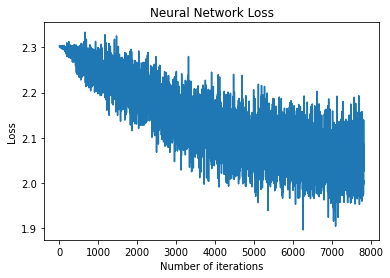

In [ ]:
show_loss_history(loss_history3)

The loss history plot above suggests this model approached closer to convergence than the previous two. We should note that this might imply the previous two models would perform better with more training, but this one may have reached the limit of its effectiveness.

With this in mind, let's look at the accuracy we get.

In [ ]:
test_accuracy(model_3, compr_test_2, ref_dataset=cifar_dataset_test)

Total accuracy = 28.16%


We once again got an even higher accuracy with a model that took less time to train! Again, it's not necessarily higher by a siginificant amount so we can't definitely say it is better. However, just like with the last model even similar performance is a success when the newer model trains faster.

If I had more time to work on this assignment I would play around with different PCA compression factors. I would also investigate how to build a PCA algorithm of my own because that seems like an interesting problem to tackle.